In [1]:


import os
import json
import torch
import random
import pandas as pd
import numpy as np
from torch.utils.data import Dataset, random_split, DataLoader
from PIL import Image
import torchvision.models as models
from tqdm.notebook import tqdm
from torchvision import transforms
import torch.nn.functional as F
import torch.nn as nn
from torchvision.utils import make_grid

import os
import re
import requests

import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')



In [2]:
# Read the csv file into a pandas DataFrame
df = pd.read_csv('beer_glossary.csv')

# Convert 'region_attributes' and 'region_shape_attributes' columns from JSON strings to dictionaries
df['region_attributes'] = df['region_attributes'].apply(json.loads)
df['region_shape_attributes'] = df['region_shape_attributes'].apply(json.loads)

# Extract dictionaries into separate columns
attributes_df = df['region_attributes'].apply(pd.Series)
shape_attributes_df = df['region_shape_attributes'].apply(pd.Series)

# Drop the original 'region_attributes' and 'region_shape_attributes' columns
df = df.drop(['region_attributes', 'region_shape_attributes'], axis=1)

# Concatenate the original DataFrame with the new attributes DataFrames
df = pd.concat([df, attributes_df, shape_attributes_df], axis=1)

# Display the DataFrame
print(df.head())

     filename  file_size file_attributes  region_count  region_id  \
0  beer_0.jpg    3815362              {}             1          0   
1  beer_1.jpg    3136798              {}             1          0   
2  beer_2.jpg    2168067              {}             1          0   
3  beer_3.jpg    2295654              {}             1          0   
4  beer_4.jpg    2327034              {}             1          0   

         Brand              Name   Brew_Type Alc_Content Keyword_1 Keyword_2  \
0        Spike        Pastelleur   Sour Beer        4.2%     Sweet    Fruity   
1  Stigbergets       Summer Wine   Sour Beer          7%     Sweet    Fruity   
2     Duckpond   Jumping Jupiter   Sour Beer        4.7%      Sour    Fruity   
3     Duckpond  Nik Gose Bananas   Sour Beer          6%      Sour    Fruity   
4       Arboga        Mörk Lager  Dark Lager        5.5%     Sweet    Fruity   

   Keyword_3  name    x    y  width  height  
0       Sour  rect  675  812   1441    2895  
1       Sour

In [3]:
type_labels = list(set(df['Brew_Type']))

In [4]:
print(type_labels)

['Lager', 'Dark Lager', 'Ale', 'Porter', 'IPA', 'White Beer', 'Stout', 'Sour Beer', 'Pilsner']


In [5]:
#creating a list of classes
classes = type_labels
len(classes)

9

In [6]:
def encode_label(label, classes_list=classes): 
    target = torch.zeros(len(classes))
    idx = classes_list.index(label)
    target[idx] = 1
    return target


def decode_target(target, threshold=0.5): #decoding the prediction tensors of 0s and 1s into text form
    result = []
    for i, x in enumerate(target):
        if (x >= threshold):
          result.append(classes[i])     
    return ' '.join(result)

In [7]:
class Collator(object):
    def __call__(self, batch):
        imgs = [item['img'] for item in batch]
        augmented_imgs = [item['augmented_img'] for item in batch]
        
        # Extend the imgs list to include augmented images
        imgs.extend(augmented_imgs)
        
        # Stack all the images (original and augmented) into a single tensor
        imgs = torch.stack(imgs, 0)
        
        item = {'img': imgs}
        
        if 'label' in batch[0].keys():
            labels = [item['label'] for item in batch]
            
            # Double the labels as there's now an augmented image for each original image
            labels.extend(labels)
            
            item['label'] = torch.stack(labels, 0)  # Stack the label tensors
        
        return item

In [8]:
class Dataset(Dataset):
    def __init__(self, opt, mode='train'):
        super(Dataset, self).__init__()
        
        # Loading images
        self.img_dir = os.path.join(opt['path'], opt['imgdir'])
        
        # Loading annotations
        self.anno_dir = os.path.join(opt['path'], 'Cropped_Labels')
        
        # Ensuring only files are included, excluding directories
        self.images = [f for f in os.listdir(self.img_dir) if os.path.isfile(os.path.join(self.img_dir, f))]
        
        self.images = os.listdir(self.img_dir)
        
        # Train-Test-Validation splitting procedure

        random.seed(42)  # Setting seed for reproducibility
        random.shuffle(self.images)  # Shuffling the list of images

        # Splitting data into training, validation, and testing sets
        split_train = int(0.8 * len(self.images))
        split_val = split_train + int(0.1 * len(self.images))

        train_images = self.images[:split_train]
        val_images = self.images[split_train:split_val]
        test_images = self.images[split_val:]


        if mode == 'train':
            self.images = train_images
            self.augment = True
        elif mode == 'val':
            self.images = val_images
            self.augment = False
        else:  # 'test'
            self.images = test_images
            self.augment = False

        self.nSamples = len(self.images)

        
        # Using training data if train flag is True, else using testing data
        self.nSamples = len(self.images)

        transform_list = [transforms.Resize((96, 64)),  # Resizing the pictures to a common dimension
                          transforms.ToTensor(),
                          transforms.Normalize((0.5,), (0.5,))]
        self.transform = transforms.Compose(transform_list)
        self.collate_fn = Collator()

    def __len__(self):
        return self.nSamples

    def augment_character(self,char_img):
        # Example augmentations using PIL
        char_img = char_img.rotate(random.uniform(-10, 10))  # Random rotation
        char_img = ImageEnhance.Color(char_img).enhance(random.uniform(0.8, 1.2))  # Random color adjustment
        char_img = ImageEnhance.Contrast(char_img).enhance(random.uniform(0.8, 1.2))  # Random contrast adjustment
        return char_img

    def augment_image(self,img):

        # Passing the original image to the augment_character function
        augmented_img = augment_character(img)

        return augmented_img  
    
    def __getitem__(self, index):
        assert index < len(self), 'index range error'
        img_name = self.images[index]
        img_path = os.path.join(self.img_dir, img_name)

        # Skip if img_path is a directory
        if os.path.isdir(img_path):
            return self.__getitem__(index + 1)

        anno_path = os.path.join(self.anno_dir, f"{img_name.split('.')[0]}.txt")
        img = Image.open(img_path)

        # Check if we should augment the image
        if self.augment:
            augmented_img = self.augment_image(img)
        else:
            # If no augmentation, just clone the original image
            augmented_img = img.copy()

        # Apply transformations
        if self.transform is not None:
            img = self.transform(img)
            augmented_img = self.transform(augmented_img)

        # Read labels from the annotation file
        labels = {}
        with open(anno_path, 'r') as file:
            lines = file.readlines()
            keywords = []
            for line in lines:
                key, value = line.split(": ")
                key, value = key.strip(), value.strip()

                # Add specific keys directly
                if key in ["Brew_Type", "Alc_Content"]:
                    labels[key] = value

                # Accumulate keywords
                if key.startswith("Keyword_"):
                    keywords.append(value)

            # Add the list of keywords to the dictionary under "Keywords"
            labels["Keywords"] = keywords
        

        labels["Brew_Type"] = encode_label(labels["Brew_Type"])
        #print(labels["Brew_Type"])
                                           
        item = {'img': img, 'augmented_img': augmented_img, 'label': labels["Brew_Type"]}

        return item


In [9]:
opt = {'path': './Beer_Images_Cropped/', 'imgdir': 'Cropped_Images'}
train_dataset = Dataset(opt, mode='train')
test_dataset = Dataset(opt, mode='test')
val_dataset = Dataset(opt, mode='val')

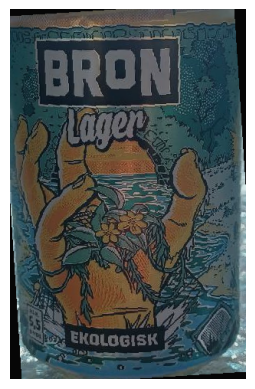

In [10]:
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance, ImageOps

import random

def augment_character(char_img):
    char_img = char_img.rotate(random.uniform(-10, 10))  # Random rotation
    char_img = ImageEnhance.Color(char_img).enhance(random.uniform(0.8, 1.2))  # Random color adjustment
    char_img = ImageEnhance.Contrast(char_img).enhance(random.uniform(0.8, 1.2))  # Random contrast adjustment
    return char_img

def augment_image(img_path):
    img = Image.open(img_path)
    
    # Passing the original image to the augment_character function
    augmented_img = augment_character(img)

    return augmented_img

# Usage:
augmented_image = augment_image('./Beer_Images_Cropped/Cropped_Images/beer_1001_1795.jpg')


plt.imshow(augmented_image, cmap='gray')
plt.axis('off')
plt.show()

In [11]:
# Helper function that I use to check if the images and labels are correctly loaded into the dataset class
def imshow(img, title=None):
    # Converting from Torch tensor to numpy array
    img = img.numpy().transpose((1, 2, 0))
    # Undoing normalization
    mean = 0.5
    std = 0.5
    img = std * img + mean
    img = img.clip(0, 1)  # Clip values to be between 0 and 1
    plt.imshow(img, cmap='gray' if len(img.shape)==2 else None)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # Pausing to update the plots

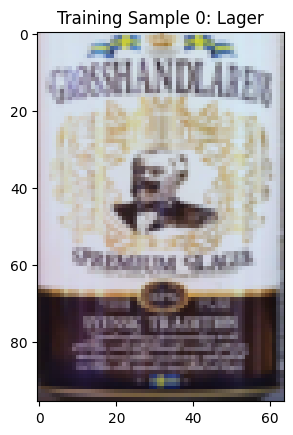

tensor([0., 0., 0., 0., 0., 0., 0., 0., 1.])


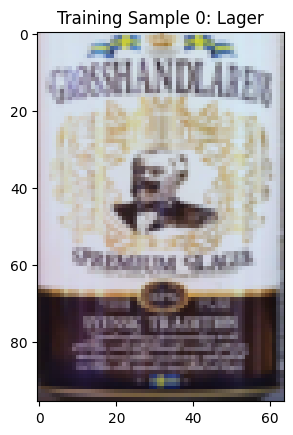

In [12]:
def show_example(image, label):
    imshow(image, title=f"Training Sample 0: {decode_target(label)}")


train_sample = test_dataset[5]
# Displaying the first training sample
show_example(train_sample['augmented_img'], train_sample['label'])

print(train_dataset[10]['label'])


plt.figure()
imshow(train_sample['augmented_img'], title=f"Training Sample 0: {decode_target(train_sample['label'])}")



In [13]:

def train_dataloader(data_train, batch_size):
    # logging.info('training data loader called')
    loader = torch.utils.data.DataLoader(data_train,
            batch_size=batch_size,
            collate_fn=Collator(),
            shuffle=True)
    return loader

def val_dataloader(data_val, batch_size):
    # logging.info('val data loader called')
    loader = torch.utils.data.DataLoader(data_val,
            batch_size=batch_size,
            collate_fn=Collator())
    return loader

#setting batch size for Dataloader to load the data batch by batch
batch_size = 32
train_loader = train_dataloader(train_dataset, batch_size)
val_loader = val_dataloader(val_dataset, batch_size * 2)



tensor([[[[-0.0039,  0.0745,  0.1373,  ...,  0.5137,  0.4510,  0.2471],
          [-0.0431, -0.0039,  0.0588,  ...,  0.5059,  0.4039,  0.1843],
          [-0.0275,  0.0039,  0.0431,  ...,  0.1216,  0.0745, -0.0118],
          ...,
          [ 0.4275,  0.4275,  0.4431,  ...,  0.5765,  0.5843,  0.5451],
          [ 0.4275,  0.4353,  0.4510,  ...,  0.5686,  0.5451,  0.5373],
          [ 0.4431,  0.4510,  0.4588,  ...,  0.5686,  0.5843,  0.5922]],

         [[-0.1216, -0.0980, -0.0510,  ...,  0.5608,  0.4902,  0.2549],
          [-0.1529, -0.1686, -0.1294,  ...,  0.4980,  0.3961,  0.1529],
          [-0.1294, -0.1451, -0.1216,  ...,  0.0196, -0.0039, -0.0745],
          ...,
          [ 0.3647,  0.3725,  0.3961,  ...,  0.5686,  0.5765,  0.5373],
          [ 0.3725,  0.3882,  0.4039,  ...,  0.5529,  0.5373,  0.5294],
          [ 0.3961,  0.4039,  0.4118,  ...,  0.5608,  0.5765,  0.5843]],

         [[-0.3961, -0.4510, -0.4745,  ...,  0.4980,  0.4039,  0.1137],
          [-0.4118, -0.5059, -

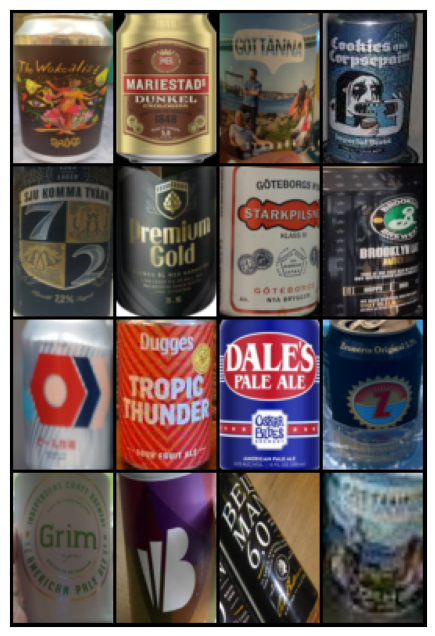

In [14]:
def denorm(img, title=None):
    # Converting from Torch tensor to numpy array
    print(img)
    #img = img.numpy().transpose((1, 2, 0))
    # Undoing normalization
    mean = 0.5
    std = 0.5
    #img = std * img + mean
    #img = img.clip(0, 1)  # Clip values to be between 0 and 1
    return std * img + mean


#let's see a batch of images (16 images) in a grid
def show_batch(dl, nmax=16):
    for batch in dl:
        #print(batch['label'])
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(denorm(batch['img'][:nmax]), nrow=4).permute(1, 2, 0))
        break

show_batch(train_loader)

In [15]:
def F_score(output, label, threshold=0.5, beta=1): #Calculate the accuracy of the model
    prob = output > threshold
    label = label > threshold

    TP = (prob & label).sum(1).float()
    TN = ((~prob) & (~label)).sum(1).float()
    FP = (prob & (~label)).sum(1).float()
    FN = ((~prob) & label).sum(1).float()

    precision = torch.mean(TP / (TP + FP + 1e-12))
    recall = torch.mean(TP / (TP + FN + 1e-12))
    F2 = (1 + beta**2) * precision * recall / (beta**2 * precision + recall + 1e-12)
    return F2.mean(0)


class MultilabelImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images = batch['img']
        targets = batch['label']
        out = self(images)                            # Generate predictions
        loss = F.binary_cross_entropy(out, targets)   # Calculate loss
        return loss    

    def validation_step(self, batch):
        images = batch['img']
        targets = batch['label']
        out = self(images)                           # Generate predictions
        loss = F.binary_cross_entropy(out, targets)  # Calculate loss
        score = F_score(out, targets)                # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_score': score.detach() }      


    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()       # Combine losses and get the mean value
        batch_scores = [x['val_score'] for x in outputs]    
        epoch_score = torch.stack(batch_scores).mean()      # Combine accuracies and get the mean value
        return {'val_loss': epoch_loss.item(), 'val_score': epoch_score.item()}    

    def epoch_end(self, epoch, result):                     # display the losses
        print("Epoch [{}], last_lr: {:.4f}, train_loss: {:.4f}, val_loss: {:.4f}, val_score: {:.4f}".format(epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_score']))

In [16]:
#helper functions to load the data and model onto GPU
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device("cuda:2")
    else:
        return torch.device('cpu')  


def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    elif isinstance(data, dict):
        return {k: to_device(v, device) for k, v in data.items()}
    return data.to(device, non_blocking=True)


class DeviceDataLoader():  
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device       

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

device = get_default_device()
device

device(type='cuda', index=2)

In [17]:
#loading training and validation data onto GPU
train_dl = DeviceDataLoader(train_loader, device)
val_dl = DeviceDataLoader(val_loader, device)

In [18]:
# checking up the shapes of the datas
for batch in train_dl:
  print(batch['img'].shape)
  print(batch['label'].shape)
  break

torch.Size([64, 3, 96, 64])
torch.Size([64, 9])


In [19]:
for batch in val_dl:
  print(batch['img'].shape)
  print(batch['label'].shape)
  break

torch.Size([128, 3, 96, 64])
torch.Size([128, 9])


In [20]:
from tqdm.notebook import tqdm

@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)


def fit(epochs, lr, model, train_loader, val_loader, opt_func=torch.optim.SGD):
    history = []
    optimizer = opt_func(model.parameters(), lr)
    for epoch in range(epochs):
        # Training Phase
        model.train()
        train_losses = []
        for batch in tqdm(train_loader):
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    return history


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def fit_one_cycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0, grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []

    # Set up custom optimizer with weight decay
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # Set up one-cycle learning rate scheduler
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader)) #schedule the learning rate with OneCycleLR

    for epoch in range(epochs):
        # Training Phase
        model.train()
        train_losses = []
        lrs = []
        for batch in tqdm(train_loader):
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # Gradient clipping
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            # Record & update learning rate
            lrs.append(get_lr(optimizer))
            sched.step()

        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
    return history


In [21]:
def conv_block(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1), 
              nn.BatchNorm2d(out_channels), 
              nn.ReLU(inplace=True)]
    if pool: layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)



class ResNet15(MultilabelImageClassificationBase):
    def __init__(self, in_channels, num_classes):
        super().__init__()     
        
        self.conv1 = conv_block(in_channels, 64)  
        self.res1 = nn.Sequential(conv_block(64, 64), conv_block(64, 64)) 


        self.conv2 = conv_block(64, 128, pool=True) 
        self.res2 = nn.Sequential(conv_block(128, 128), conv_block(128, 128), conv_block(128, 128))  


        self.conv3 = conv_block(128, 512, pool=True) 
        self.res3 = nn.Sequential(conv_block(512, 512), conv_block(512, 512)) 


        self.conv4 = conv_block(512, 1024, pool=True) 
        self.res4 = nn.Sequential(conv_block(1024, 1024), conv_block(1024, 1024)) 


        self.classifier = nn.Sequential(
                                        nn.Flatten(), 
                                        nn.Dropout(0.2),
                                        nn.Linear(1024 * 1 * 1, 512),
                                        nn.ReLU(),
                                        nn.Linear(512, num_classes))   

    def forward(self, xb):
        out = self.conv1(xb)
        out = self.res1(out) + out
        out = self.conv2(out)
        out = self.res2(out) + out
        out = self.conv3(out)
        out = self.res3(out) + out
        out = self.conv4(out)
        out = self.res4(out) + out
        out = self.classifier(out)
        out = F.softmax(out)
        return out

In [22]:
print(len(classes))

9


In [23]:
model = to_device(ResNet15(3, len(classes)), device) #input size: 3, output size: 9, loading model onto GPU
model

ResNet15(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=Fa

In [24]:
#checking the shape of outputs that the model will produce before starting the training process
for batch in train_dl:
    print(batch['img'].shape)
    outputs = model(batch['img'])
    break

print('outputs.shape : ', outputs.shape)
print('Sample outputs :\n', outputs[:2].data)

torch.Size([64, 3, 96, 64])
outputs.shape :  torch.Size([64, 9])
Sample outputs :
 tensor([[0.0311, 0.1417, 0.0525, 0.0701, 0.2494, 0.1387, 0.0818, 0.0505, 0.1842],
        [0.0454, 0.1133, 0.0790, 0.0557, 0.2017, 0.1531, 0.1096, 0.0631, 0.1791]],
       device='cuda:2')


In [25]:
# Get the first batch of data from the validation DataLoader
first_batch = next(iter(train_dl))
labels = first_batch['label'] 

# Print the shape
print(labels.shape)

torch.Size([64, 9])


In [26]:
history = [evaluate(model, val_dl)]
history

[{'val_loss': 0.3508099615573883, 'val_score': 0.0}]

In [27]:


epochs = 10
max_lr = 0.001
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam



In [28]:


%%time
history += fit_one_cycle(epochs, max_lr, model, train_dl, val_dl,
                         grad_clip=grad_clip, 
                         weight_decay=weight_decay, 
                         opt_func=opt_func)



  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [0], last_lr: 0.0003, train_loss: 0.2893, val_loss: 0.4286, val_score: 0.3070


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [1], last_lr: 0.0008, train_loss: 0.2539, val_loss: 0.2510, val_score: 0.2961


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [2], last_lr: 0.0010, train_loss: 0.2258, val_loss: 0.2276, val_score: 0.4408


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [3], last_lr: 0.0010, train_loss: 0.1784, val_loss: 0.3485, val_score: 0.4268


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [4], last_lr: 0.0008, train_loss: 0.1367, val_loss: 0.1579, val_score: 0.6629


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [5], last_lr: 0.0006, train_loss: 0.0957, val_loss: 0.1555, val_score: 0.7400


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [6], last_lr: 0.0004, train_loss: 0.0523, val_loss: 0.1097, val_score: 0.8011


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [7], last_lr: 0.0002, train_loss: 0.0230, val_loss: 0.0693, val_score: 0.8868


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [8], last_lr: 0.0000, train_loss: 0.0100, val_loss: 0.0545, val_score: 0.9055


  0%|          | 0/77 [00:00<?, ?it/s]

Epoch [9], last_lr: 0.0000, train_loss: 0.0054, val_loss: 0.0524, val_score: 0.8993
CPU times: user 9min 34s, sys: 11.7 s, total: 9min 45s
Wall time: 13min 22s


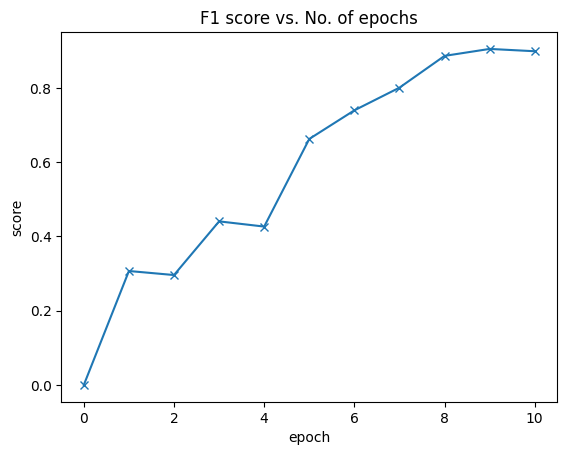

In [29]:


def plot_scores(history):
    scores = [x['val_score'] for x in history]
    plt.plot(scores, '-x')
    plt.xlabel('epoch')
    plt.ylabel('score')
    plt.title('F1 score vs. No. of epochs');
plot_scores(history)



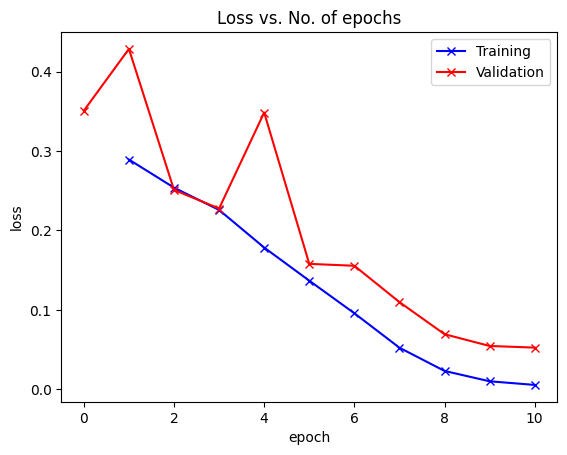

In [30]:


def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs');
    
plot_losses(history)



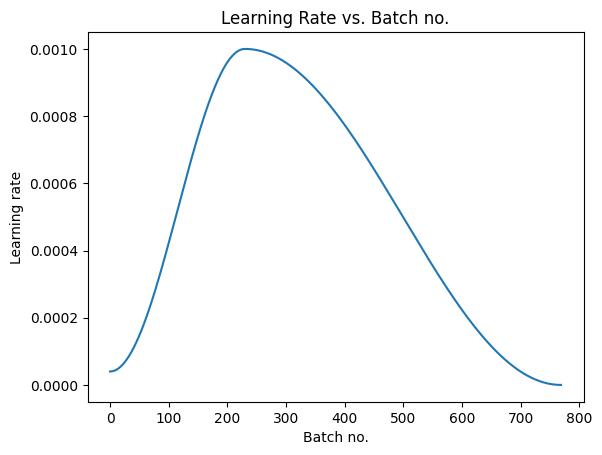

In [31]:


def plot_lrs(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.');
plot_lrs(history)



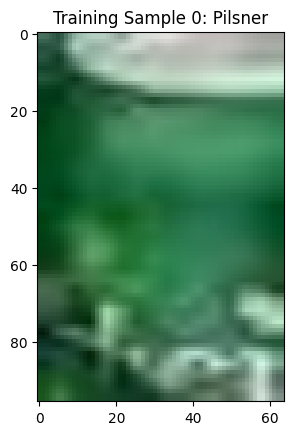

In [32]:


def predict_single(image):
    xb = image.unsqueeze(0)
    xb = to_device(xb, device)
    preds = model(xb)
    prediction = preds[0]
    show_example(image, prediction)
    
predict_single(test_dataset[10]['img']) #checking out the predictions of some images from the validation dataset.



In [33]:
def predict_all(test_ds):
    
    for beer in test_dataset:
        xb = beer['img'].unsqueeze(0)
        xb = to_device(xb, device)
        preds = model(xb)
        prediction = preds[0]
        show_example(beer['img'], prediction)
    


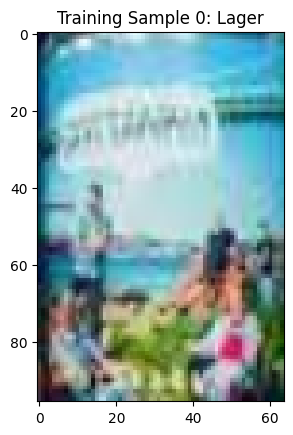

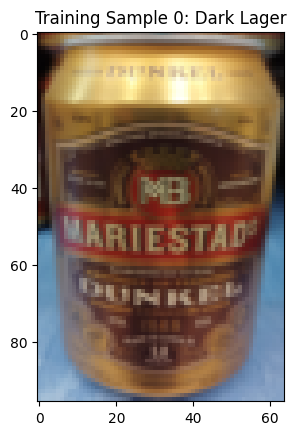

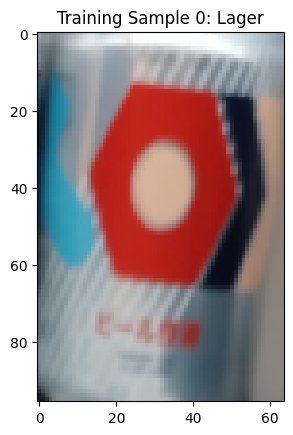

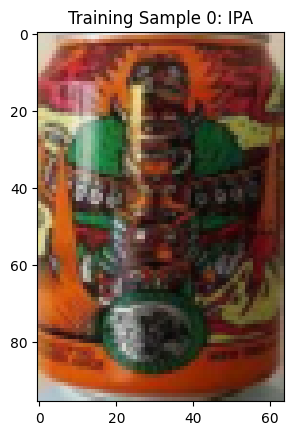

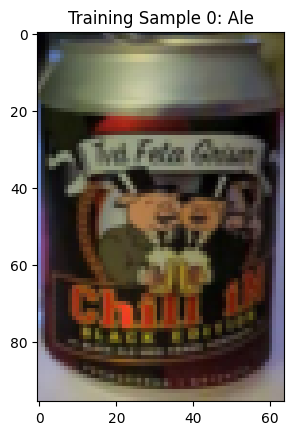

...

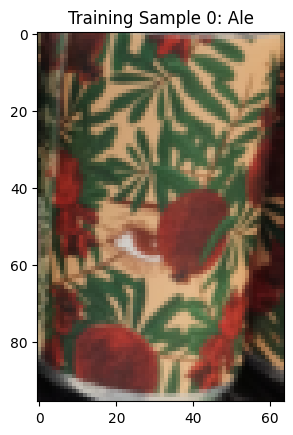

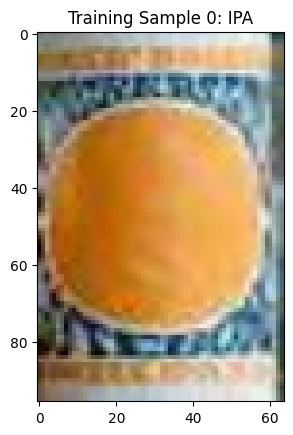

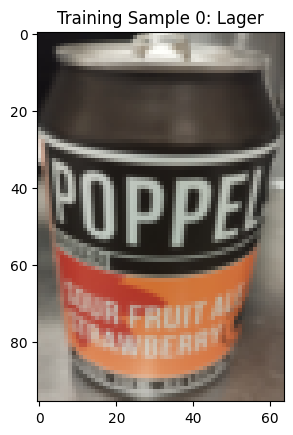

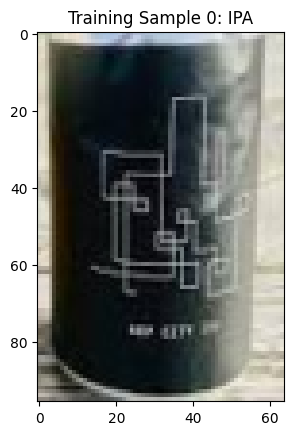

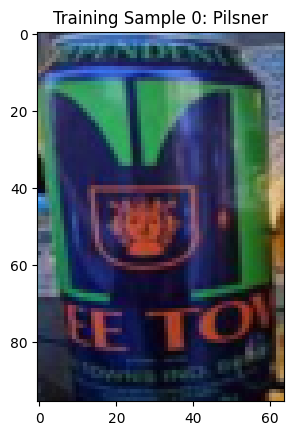

AssertionError: index range error

In [34]:
predict_all(test_dataset) #checking out the predictions of some images from the validation dataset.

In [35]:
# Saving checkpoint
checkpoint = {
    'epoch': 10,
    'model_state_dict': model.state_dict(),
    'loss': 0.0600
}

torch.save(checkpoint, 'model_checkpoint.pth')